In [ ]:
# 🚧 도시 노면 상태 분석 파이프라인 (classification & detection 모델 사전학습 가중치 사용)

!pip install -U ultralytics

from pathlib import Path
import shutil
import pandas as pd
import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image
from ultralytics import YOLO
from shapely.geometry import Polygon
import os
from google.colab import drive

drive.mount('/content/drive')


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 58.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 106.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 81.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 52.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 41.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 18.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 91.5 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstallin

In [ ]:
# ========== 1. Classification 모델 로드 ==========
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = models.resnet18(weights=None)
model.fc = nn.Linear(model.fc.in_features, 2)
model.load_state_dict(torch.load("/content/drive/MyDrive/night_day_model.pth", map_location=device))
model = model.to(device)
model.eval()

transform_eval = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

In [ ]:
# ========== 2. YOLO Detection 모델 로드 ==========
# 정확한 경로로 수정됨
model_yolo = YOLO("/content/drive/MyDrive/de_project2/yolo_best.pt")

# ========== 3. 분석 대상 이미지 불러오기 ==========
test_img_dir = Path("/content/drive/MyDrive/split_dataset/images/test")
img_list = sorted([
    str(p) for p in test_img_dir.glob("*")
    if p.suffix.lower() in [".jpg", ".jpeg", ".png", ".webp"]
])

In [ ]:
# ========== 4. Classification 수행 (낮/밤) ==========
classification_results = {}
for img_path in img_list:
    try:
        image = Image.open(img_path).convert("RGB")
        image = transform_eval(image).unsqueeze(0).to(device)
        with torch.no_grad():
            pred = torch.argmax(model(image), dim=1).item()
            classification_results[Path(img_path).name] = "밤" if pred == 1 else "낮"
    except:
        print(f"❌ 이미지 열기 실패: {img_path}")


100%|██████████| 22.2M/22.2M [00:00<00:00, 453MB/s]


0: 640x640 (no detections), 218.3ms
1: 640x640 (no detections), 218.3ms
2: 640x640 3 차선s, 218.3ms
3: 640x640 4 차선s, 218.3ms
4: 640x640 1 차선, 218.3ms
5: 640x640 3 차선s, 218.3ms
6: 640x640 3 차선s, 218.3ms
7: 640x640 4 차선s, 218.3ms
8: 640x640 1 차선, 218.3ms
9: 640x640 (no detections), 218.3ms
10: 640x640 1 차선, 218.3ms
11: 640x640 (no detections), 218.3ms
12: 640x640 1 차선, 218.3ms
13: 640x640 (no detections), 218.3ms
14: 640x640 1 차선, 218.3ms
15: 640x640 1 차선, 218.3ms
16: 640x640 1 차선, 218.3ms
17: 640x640 (no detections), 218.3ms
18: 640x640 3 쓰레기s, 4 차선s, 218.3ms
19: 640x640 (no detections), 218.3ms
20: 640x640 1 차선, 218.3ms
21: 640x640 4 차선s, 218.3ms
22: 640x640 4 차선s, 218.3ms
23: 640x640 (no detections), 218.3ms
24: 640x640 1 젖은 도로, 1 차선, 218.3ms
25: 640x640 10 쓰레기s, 1 차선, 218.3ms
26: 640x640 3 차선s, 218.3ms
27: 640x640 5 쓰레기s, 1 젖은 도로, 8 차선s, 218.3ms
28: 640x640 2 차선s, 218.3ms
29: 640x640 3 차선s, 218.3ms
30: 640x640 1 젖은 도로, 6 차선s, 218.3ms
31: 640x640 5 젖은 도로s, 6 차선s, 218.3ms
32: 640x640 1 

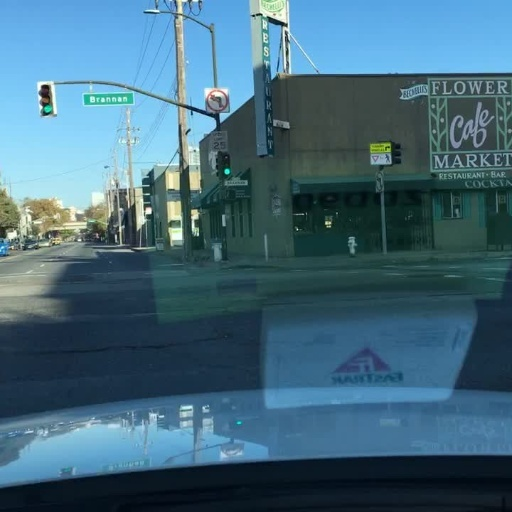

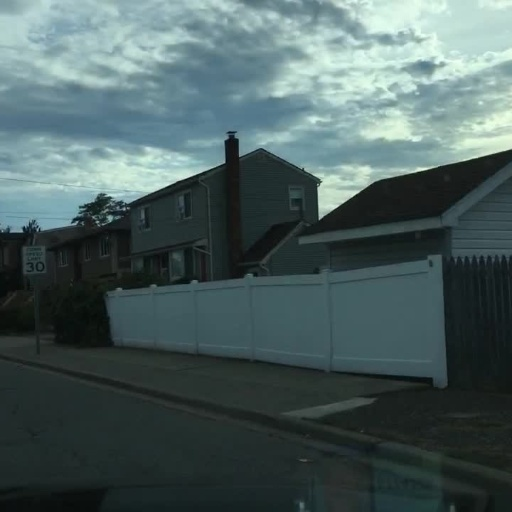

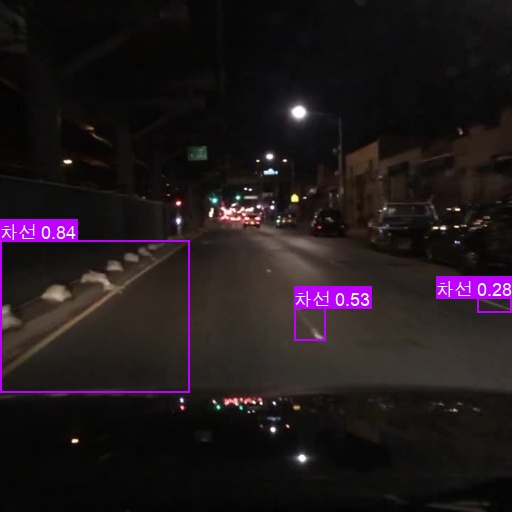

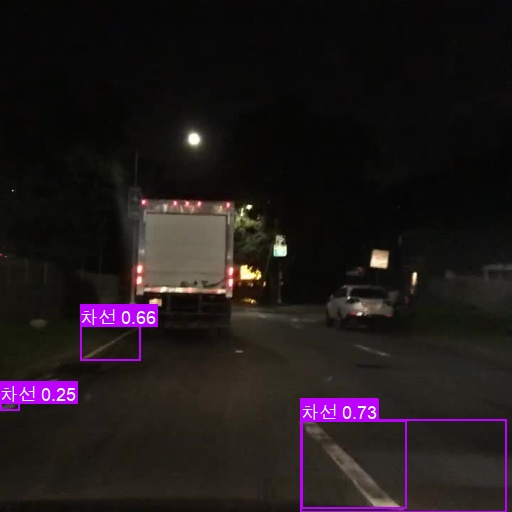

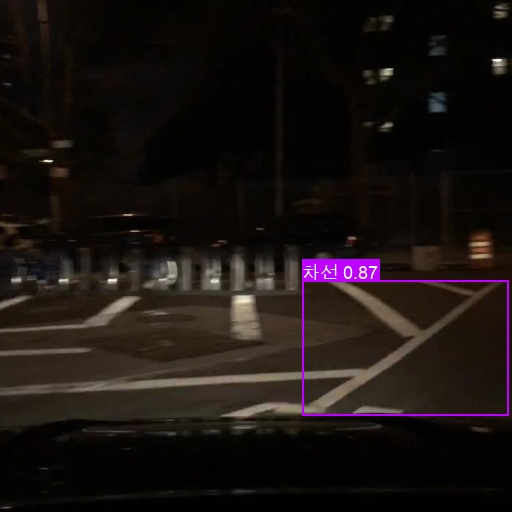

...

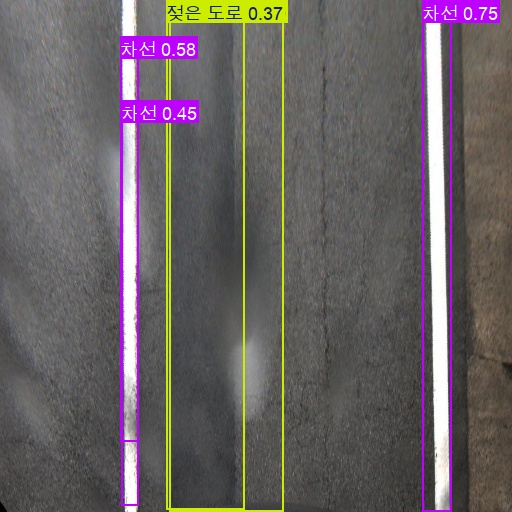

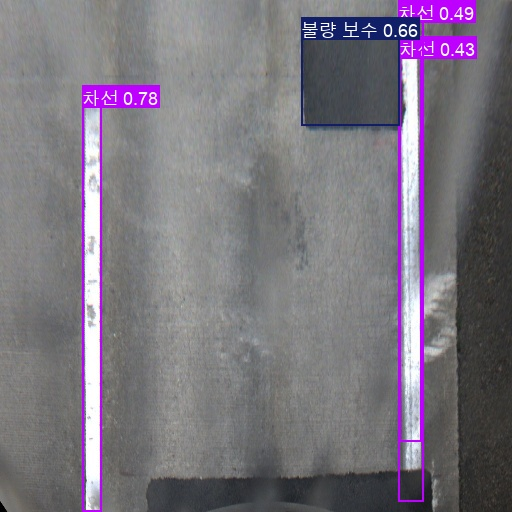

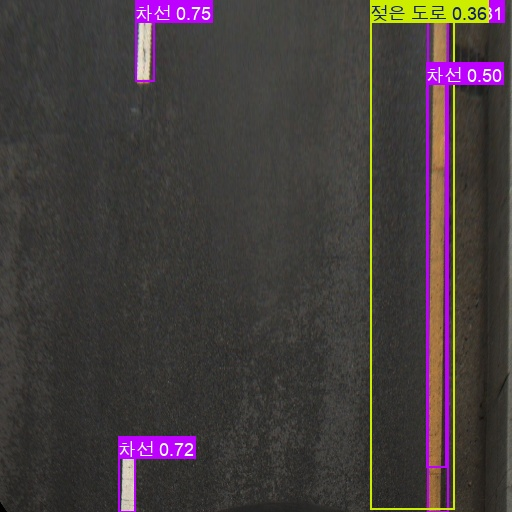

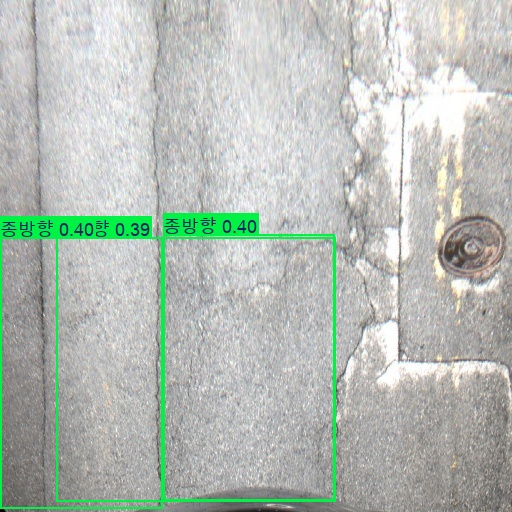

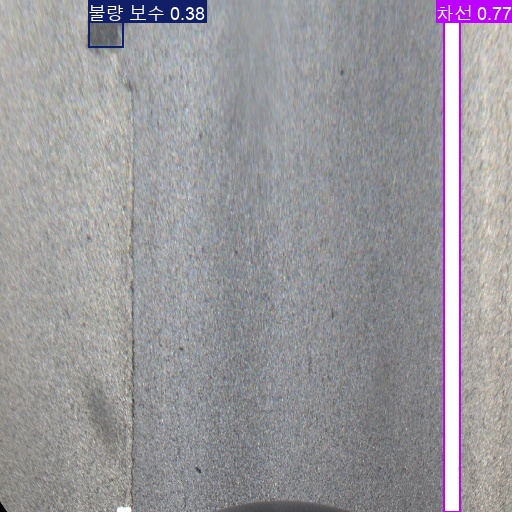

In [ ]:
# ========== 5. YOLO 탐지 수행 + bbox 이미지 바로 보기 ==========
results = model_yolo.predict(source=img_list, imgsz=640, save=True)

# 저장된 결과 이미지 바로 출력
from IPython.display import Image, display

predict_dir = "runs/detect/predict"
image_files = sorted([
    os.path.join(predict_dir, f)
    for f in os.listdir(predict_dir)
    if f.lower().endswith((".jpg", ".jpeg", ".png"))
])[:100]  # 상위 100개만 표시

for img_path in image_files:
    display(Image(filename=img_path))

demo_img_dir = "/content/drive/MyDrive/de_project2/demo_results/images"
os.makedirs(demo_img_dir, exist_ok=True)

for i, r in enumerate(results):
    r.save(filename=f"/content/demo_result_{i}.jpg")
    shutil.move(f"/content/demo_result_{i}.jpg", os.path.join(demo_img_dir, f"result_{i}.jpg"))

# ========== 6. 위험도 분류 함수 ==========

def classify_risk(label, area=None, width=None, length=None, count=None):
    # 종방향 균열
    if label == "종방향":
        if length is not None and width is not None:
            if length >= 100 or width >= 3:
                return "C"
            elif length < 100 or width < 3:
                if length < 30 and width < 1:
                    return "A"
                else:
                    return "B"
        return "B"

    # 횡방향 균열
    elif label == "횡방향":
        if count is not None:
            if count > 5:
                return "C"
            elif count <= 2 and length is not None and length < 20:
                return "A"
            elif count <= 5 or (length is not None and length < 50):
                return "B"
            else:
                return "C"
        elif length is not None:
            if length >= 50:
                return "C"
            elif length < 20:
                return "A"
            else:
                return "B"
        return "B"

    # 거북등
    elif label == "거북등":
        if area is not None:
            if area >= 0.5:
                return "C"
            elif area >= 0.1:
                return "B"
            else:
                return "A"

    # 불량 보수
    elif label == "불량 보수":
        if area is not None:
            if area > 0.3:
                return "C"
            elif area >= 0.1:
                return "B"
            else:
                return "A"

    # 포트홀
    elif label == "포트홀":
        if width is not None:
            if width >= 30:
                return "C"
            elif width >= 15:
                return "B"
            else:
                return "A"

    # 젖은 도로
    elif label == "젖은 도로":
        if area is not None:
            if area >= 3:
                return "C"
            elif area >= 1:
                return "B"
            else:
                return "A"

    # 쓰레기
    elif label == "쓰레기":
        if width is not None:
            if width >= 30:
                return "C"
            elif width >= 10:
                return "B"
            else:
                return "A"

    # Others, 차선 손상
    elif label in ["others", "차선 손상"]:
        return "A"

    # 기본값
    return "B"


def summarize_image_risk(risk_list):
    if "A" in risk_list:
        return "High"
    elif "B" in risk_list:
        return "Medium"
    elif "C" in risk_list:
        return "Low"
    else:
        return "None"


def run_risk_analysis_from_yolo_result(result, is_night=False):
    from shapely.geometry import Polygon

    PIXEL_TO_CM = 0.26
    PIXEL_TO_M = PIXEL_TO_CM / 100

    object_level_results = []
    risk_list = []

    boxes = result.boxes.xyxy.cpu().numpy()
    classes = result.boxes.cls.cpu().numpy().astype(int)
    class_names = result.names

    filename = result.path.split("/")[-1]

    for i, (box, class_id) in enumerate(zip(boxes, classes)):
        x1, y1, x2, y2 = box
        w = (x2 - x1) * PIXEL_TO_CM
        h = (y2 - y1) * PIXEL_TO_CM
        label = class_names[class_id]

        area = None
        if hasattr(result, "masks") and result.masks is not None:
            try:
                polygon_coords = result.masks.xy[i]
                poly = Polygon(polygon_coords)
                area = poly.area * (PIXEL_TO_M ** 2)
            except:
                pass

        risk = classify_risk(label, area=area, width=w, length=h)

        # ✅ 밤이면 한 단계 높이기
        if is_night:
            if risk == "C":
                risk = "B"
            elif risk == "B":
                risk = "A"

        object_level_results.append({
            "filename": filename,
            "label": label,
            "area(m²)": round(area, 3) if area else None,
            "width(cm)": round(w, 1),
            "length(cm)": round(h, 1),
            "risk_level": risk
        })

        risk_list.append(risk)

    summary = {
        "filename": filename,
        "total_damages": len(risk_list),
        "risk_grades": risk_list,
        "overall_risk": summarize_image_risk(risk_list)
    }

    return pd.DataFrame(object_level_results), pd.DataFrame([summary])


In [ ]:
# ========== 7. 위험도 분석 실행 ==========
obj_all, sum_all = [], []
for r in results:
    fname = r.path.split("/")[-1]
    is_night = classification_results.get(fname, "낮") == "밤"
    obj_df, sum_df = run_risk_analysis_from_yolo_result(r, is_night=is_night)
    obj_all.append(obj_df)
    sum_all.append(sum_df)

final_obj_df = pd.concat(obj_all, ignore_index=True)
final_sum_df = pd.concat(sum_all, ignore_index=True)

# ========== 8. 결과 저장 및 출력 ==========
print("🧾 개별 객체 분석 결과:")
display(final_obj_df)
print("📊 이미지별 종합 위험도:")
display(final_sum_df)

# 🔹 로컬에 저장
final_obj_df.to_csv("object_level_all.csv", index=False)
final_sum_df.to_csv("summary_risk_all.csv", index=False)

# 🔹 Google Drive에 저장 (예: demo_results/csv 아래)
save_dir = "/content/drive/MyDrive/de_project2/demo_results/csv"
os.makedirs(save_dir, exist_ok=True)

final_obj_df.to_csv(os.path.join(save_dir, "object_level_all.csv"), index=False)
final_sum_df.to_csv(os.path.join(save_dir, "summary_risk_all.csv"), index=False)

🧾 개별 객체 분석 결과:


,filename,label,area(m²),width(cm),length(cm),risk_level
0,01a8723d-6477ce11.jpg,차선,None,49.400002,39.500000,A
1,01a8723d-6477ce11.jpg,차선,None,7.900000,8.700000,A
2,01a8723d-6477ce11.jpg,차선,None,9.000000,3.900000,A
3,01aa2961-e390a466.jpg,차선,None,27.400000,22.799999,A
4,01aa2961-e390a466.jpg,차선,None,15.600000,9.200000,A
...,...,...,...,...,...,...
715,H_C_F_05_0825140106275.jpg,차선 손상,None,5.700000,81.000000,A
716,H_C_F_05_0825140325959.jpg,차선,None,8.200000,132.699997,B
717,H_C_F_05_0825140325959.jpg,불량 보수,None,65.300003,17.299999,B
718,H_C_F_05_0825140325959.jpg,불량 보수,None,48.599998,14.800000,B


📊 이미지별 종합 위험도:


,filename,total_damages,risk_grades,overall_risk
0,019cd27a-9ad90d04.jpg,0,[],None
1,01a4deab-9d5e5a17.jpg,0,[],None
2,01a8723d-6477ce11.jpg,3,"[A, A, A]",High
3,01aa2961-e390a466.jpg,4,"[A, A, A, A]",High
4,01c3e19a-fbacb266.jpg,1,[A],High
...,...,...,...,...
218,H_C_F_05_0825135133725.jpg,2,"[B, B]",Medium
219,H_C_F_05_0825135346504.jpg,3,"[B, B, A]",High
220,H_C_F_05_0825135952788.jpg,7,"[B, B, B, B, B, A, B]",High
221,H_C_F_05_0825140106275.jpg,3,"[B, B, A]",High


In [ ]:
# ========== 🔍 개별 이미지(result_84.jpg)만 따로 분석 ==========
from pathlib import Path

# 1. 대상 이미지 경로
target_img = "/content/drive/MyDrive/de_project2/demo_results/images/result_84.jpg"

# 2. YOLO 탐지 실행
result_84 = model_yolo.predict(source=target_img, imgsz=640)[0]

# 3. 위험도 분석 (밤 조건은 원하면 True로 설정)
obj_df_84, sum_df_84 = run_risk_analysis_from_yolo_result(result_84, is_night=True)

# 4. 결과 출력
from IPython.display import display
print("📍 개별 객체 분석 결과 (result_84.jpg):")
display(obj_df_84)

print("📍 이미지 종합 위험도:")
display(sum_df_84)

# 5. 좌표도 따로 출력
print("📦 바운딩 박스 좌표:")
boxes = result_84.boxes.xyxy.cpu().numpy()
confidences = result_84.boxes.conf.cpu().numpy()
class_ids = result_84.boxes.cls.cpu().numpy().astype(int)
class_names = result_84.names

for i in range(len(boxes)):
    x1, y1, x2, y2 = boxes[i]
    label = class_names[class_ids[i]]
    conf = confidences[i]
    print(f"🔹 {label}: ({x1:.1f}, {y1:.1f}) → ({x2:.1f}, {y2:.1f}) | conf: {conf:.2f}")



image 1/1 /content/drive/MyDrive/de_project2/demo_results/images/result_84.jpg: 640x640 3 차선s, 1 차선 손상, 226.8ms
Speed: 4.4ms preprocess, 226.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
📍 개별 객체 분석 결과 (result_84.jpg):


,filename,label,area(m²),width(cm),length(cm),risk_level
0,result_84.jpg,차선,None,9.0,114.800003,A
1,result_84.jpg,차선,None,3.6,98.900002,A
2,result_84.jpg,차선 손상,None,3.8,98.400002,A
3,result_84.jpg,차선,None,4.1,99.099998,A


📍 이미지 종합 위험도:


,filename,total_damages,risk_grades,overall_risk
0,result_84.jpg,4,"[A, A, A, A]",High


📦 바운딩 박스 좌표:
🔹 차선: (118.5, 7.5) → (153.0, 449.2) | conf: 0.55
🔹 차선: (443.2, 126.6) → (457.1, 507.0) | conf: 0.42
🔹 차선 손상: (442.9, 126.1) → (457.5, 504.5) | conf: 0.35
🔹 차선: (415.1, 127.4) → (431.0, 508.6) | conf: 0.26
